## Data Preprocessing

In [67]:
import matplotlib.pyplot as plt
import numpy as np
import time
import pandas as pd

from pydmd import HODMD
import matplotlib.gridspec as gs

import ipywidgets as widgets

In [68]:
df = pd.read_csv("../Dataset/IndiaStateWise/Cleaned_each_day.csv",header=1)
df = df.fillna(method="ffill")
df = df.drop("0",axis=1)
daily_cases = df.ewm(span=40,axis=0).mean().T
daily_cases.drop(["UT","DD"],axis=0,inplace=True)
cumulative_cases = daily_cases.cumsum(axis=1)
states = daily_cases.T.columns
daily_cases.shape

(36, 1028)

In [69]:

states



Index(['AN', 'AP', 'AR', 'AS', 'BR', 'CH', 'CT', 'DN', 'DL', 'GA', 'GJ', 'HR',
       'HP', 'JK', 'JH', 'KA', 'KL', 'LA', 'LD', 'MP', 'MH', 'MN', 'ML', 'MZ',
       'NL', 'OR', 'PY', 'PB', 'RJ', 'SK', 'TN', 'TG', 'TR', 'UP', 'WB', 'UN'],
      dtype='object')

The dataset contains 39 states for 1028 days. 

In [70]:
def plot_widget(state):

    fig = plt.figure(figsize=(10,10), constrained_layout=True)
    gs = fig.add_gridspec(nrows=2,ncols=1)

    ax1 = fig.add_subplot(gs[0,0])
    ax1.set_title("Day Wise Cases")
    ax1.set_xlabel("Days")
    ax1.set_ylabel("Number of Cases")
    daily_cases.loc[state,:].plot(ax=ax1)
    ax1.grid(True,  color='k',alpha=0.2,linestyle=':',linewidth=1,axis='x')


    ax2 = fig.add_subplot(gs[1,0])
    ax2.set_title("Cumulative Cases")
    cumulative_cases.loc[state,:].plot(ax=ax2)
    ax2.set_xlabel("Days")
    ax2.set_ylabel("Number of Cases")
    ax2.grid(True,  color='k',alpha=0.2,linestyle=':',linewidth=1,axis='x')

    plt.show()

widgets.interact(plot_widget,state=states)


interactive(children=(Dropdown(description='state', options=('AN', 'AP', 'AR', 'AS', 'BR', 'CH', 'CT', 'DN', '…

<function __main__.plot_widget(state)>

# Prediction using HODMD

In [5]:
train_days = 100
pred_days = 40
start_day = 0
d=20


  

In [6]:
train,test = train_test_split(daily_cases,train_days,pred_days,start_day)
print(f"Shape of train set is {train.shape} and test set is {test.shape}")

NameError: name 'train_test_split' is not defined

In [71]:


class Experiment():
    
    def __init__(self, X,
                 train_params = {"start_day":0, "train_days":40, "pred_days":5},
                 HODMD_params = { "svd_rank":0, "tlsq_rank":0, "exact":False, "opt":False,
                 "rescale_mode":None, "forward_backward":False, "d":35,
                 "sorted_eigs":False, "reconstruction_method":"first",
                 "svd_rank_extra":0},
                row_mask=None):
        self.start_day = train_params["start_day"]
        self.train_days = train_params["train_days"]
        self.pred_days = train_params["pred_days"]
        self.X = X
        self.DMD = HODMD(**HODMD_params)
        
        self.row_mask = row_mask
        self.train_data ,self.ground_truth = Experiment.train_test_split(self.X,self.train_days,self.pred_days,self.start_day,self.row_mask)
        self.metrics = {}

    @staticmethod
    def train_test_split(df,train_days,pred_days,start_day,row_mask=None):
        if row_mask==None:
            train = df.loc[:,start_day:start_day+train_days-1]
            test = df.loc[:, start_day+train_days: start_day+train_days+pred_days-1]
        else:
            try:
                train = df.loc[row_mask,start_day:start_day+train_days-1]
                test = df.loc[row_mask, start_day+train_days: start_day+train_days+pred_days-1]
            except:
                raise Exception("mask should be compatible with the indices of rows")
    
        return train,test

    def fit(self):

        snapshot = self.train_data.to_numpy()
        self.DMD = self.DMD.fit(snapshot)
        print(self.DMD.eigs.shape)
        #self.DMD.original_time['t0'] = self.DMD.dmd_time['t0'] = self.start_day
        self.DMD.original_time['tend'] = self.DMD.dmd_time['tend'] = (self.train_days-1)
        self.reconstructed_data = self.DMD.reconstructed_data.real
        
    def pred(self):
        #self.DMD.dmd_time['t0'] = self.start_day
      
        self.DMD.dmd_time['tend'] = ( self.train_days + self.pred_days - 1)
        
        self.pred_data =  self.DMD.reconstructed_data.real[:, self.train_days:(  self.train_days + self.pred_days)]
        #self.pred_data =  self.DMD.reconstructed_data.real
        
     
       # self.MAPE();
        return self.pred_data

    def MAPE(self):
        gt = self.ground_truth.to_numpy() 
        self.metrics["MAPE"] = np.abs((gt-self.pred_data)/(gt+0.00000001)).mean(axis=1)   
        return self.metrics["MAPE"]

    def plot_pred(self,row_num=1,ax=None):
        #plt.plot(np.arange(self.start_day+self.train_days,(self.start_day + self.train_days + self.pred_days)),self.pred_data[row_num,:])

        #plt.plot(np.arange(self.start_day,self.start_day+self.train_days ),self.reconstructed_data[row_num,:])


        gt_time_steps = np.arange(self.start_day+self.train_days ,self.start_day+self.train_days +self.pred_days )
        train_time_steps = np.arange(self.start_day,self.start_day+self.train_days  )

        #plt.plot(gt_time_steps,self.ground_truth.iloc[row_num,:],'g')
    
        #plt.plot(train_time_steps, self.train_data.iloc[row_num,:],'r')
       # plt.plot(train_time_steps, self.reconstructed_data[row_num,:],'b')

        plt.plot(gt_time_steps , self.pred_data[row_num,:])
      
        #plt.legend([ "Predicted" , "Reconstructed", "Ground Truth", "Train Data"])
        
       # plt.legend(["GT","Train","Pred"])


        
    
 
        
        
        
        
        

In [9]:
exp.DMD.dmd_time

NameError: name 'exp' is not defined

In [258]:
daily_cases.shape

(36, 1028)

In [494]:
exp.pred().shape

(36, 20)

In [513]:
np.concatenate((np.arange(5) ,np.arange(6,10)))

array([0, 1, 2, 3, 4, 6, 7, 8, 9])

In [645]:
exp.DMD.eigs.reshape(-1,1).shape

(36, 1)

In [72]:
from numpy import matlib as mb



train_params = {"start_day":0, "train_days":60, "pred_days":5}
HODMD_params = { "svd_rank":daily_cases.shape[0], "tlsq_rank":0, "exact":False, "opt":False,
                 "rescale_mode":None, "forward_backward":False, "d":20,
                 "sorted_eigs":False, "reconstruction_method":"first",
                 "svd_rank_extra":0}
exps = []
preds = []
recs = []

exp = Experiment(daily_cases,train_params=train_params,HODMD_params=HODMD_params);
exp.fit();
preds = exp.pred()
pred_timesteps = np.arange(train_params["start_day"]+train_params["train_days"],train_params["start_day"]+train_params["train_days"]+ train_params["pred_days"])

lambdas = mb.repmat(exp.DMD.eigs.reshape(-1,1),1,train_params["pred_days"] )

for epoch_start_day in range(train_params["start_day"], daily_cases.shape[1]-(train_params["pred_days"]+train_params["train_days"]), train_params["pred_days"] ):
 
    train_params_tilde = {"start_day":epoch_start_day, "train_days":60, "pred_days":5}

    pred_timesteps = np.concatenate( (pred_timesteps, np.arange(epoch_start_day+train_params["train_days"],epoch_start_day+train_params["train_days"]+ train_params["pred_days"])))

    exp = Experiment(daily_cases,train_params=train_params_tilde,HODMD_params=HODMD_params);
    exp.fit()
    preds = np.concatenate((preds, exp.pred()), axis=1);
    exps.append(exp)
    lambdas = np.concatenate((lambdas,   mb.repmat(exp.DMD.eigs.reshape(-1,1),1,train_params_tilde["pred_days"] )    ), axis=1 )
 
  
   


c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number inf. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 4.6215831298243514e+20. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 9.234242347111997e+18. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 9.830045488459207e+18. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\a

(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)


c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 3.0035442658668974e+19. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 3.1819454060836e+19. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 3.711515291781234e+19. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 3.3354956319736426e+19. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(


(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)


c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 59118809.62407646. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 86079296.88746415. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 107086457.08397628. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 113916699.6587586. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu

(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)


c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 122568769033897.47. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 210589071114124.62. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 203543045351734.0. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 167504712703035.44. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vish

(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)


c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 1678816417788604.0. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 2598984845285128.0. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 3501093599597502.5. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 4218313791341198.0. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vis

(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)


c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 1.1040703583775918e+18. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 1.1456553857200983e+18. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 1.2893539189015977e+18. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 2.0377786416917727e+18. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.wa

(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)
(36,)


c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 3.866570717226564e+33. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 7.193212183278133e+16. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 3.054760991348274e+34. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 9.206886223158266e+16. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(


In [653]:
lambdas.shape

(36, 970)

In [11]:
preds.shape

(36, 970)

In [12]:
pred_timesteps.shape

(970,)

In [84]:
from numpy import matlib as mb



train_params = {"start_day":200, "train_days":200, "pred_days":300}
HODMD_params = { "svd_rank":daily_cases.shape[0], "tlsq_rank":0, "exact":False, "opt":False,
                 "rescale_mode":None, "forward_backward":False, "d":20,
                 "sorted_eigs":False, "reconstruction_method":"first",
                 "svd_rank_extra":0}
exps = []
preds = []
recs = []

exp = Experiment(daily_cases,train_params=train_params,HODMD_params=HODMD_params);
exp.fit();
preds = exp.pred()
pred_timesteps = np.arange(train_params["start_day"]+train_params["train_days"],train_params["start_day"]+train_params["train_days"]+ train_params["pred_days"])

lambdas = mb.repmat(exp.DMD.eigs.reshape(-1,1),1,train_params["pred_days"] )


(36,)


c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 399863.98332152824. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 150852.42284191033. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(


In [75]:
preds

array([[ 3.35237338e+00,  3.63321950e+00,  4.14023300e+00, ...,
         1.81511331e+06,  1.89717313e+06,  1.98373289e+06],
       [ 6.30862855e+02,  6.75159462e+02,  7.63232085e+02, ...,
         2.99022136e+08,  3.12752851e+08,  3.27197247e+08],
       [ 4.72584454e+00,  7.22841332e+00,  9.29568644e+00, ...,
         3.83404768e+06,  4.01209968e+06,  4.19980243e+06],
       ...,
       [ 8.08499092e+02,  8.83085445e+02,  9.68970675e+02, ...,
         4.27087298e+08,  4.46701407e+08,  4.67313636e+08],
       [ 5.70329458e+02,  6.18825702e+02,  6.61321288e+02, ...,
         4.31722818e+08,  4.51473114e+08,  4.72164239e+08],
       [-1.95049036e-01, -1.52453269e-01, -2.18474711e-01, ...,
        -3.37745834e+04, -3.47906356e+04, -3.59940236e+04]])

In [78]:
from numpy import matlib as mb



train_params = {"start_day":0, "train_days":80, "pred_days":40}
HODMD_params = { "svd_rank":daily_cases.shape[0], "tlsq_rank":0, "exact":False, "opt":False,
                 "rescale_mode":None, "forward_backward":False, "d":20,
                 "sorted_eigs":False, "reconstruction_method":"first",
                 "svd_rank_extra":0}
exps1 = []
preds1 = []
recs = []

exp1 = Experiment(daily_cases,train_params=train_params,HODMD_params=HODMD_params);
exp1.fit();
preds1 = exp1.pred()
pred_timesteps1 = np.arange(train_params["start_day"]+train_params["train_days"],train_params["start_day"]+train_params["train_days"]+ train_params["pred_days"])

lambdas = mb.repmat(exp.DMD.eigs.reshape(-1,1),1,train_params["pred_days"] )


(36,)


c:\Users\Vishnu\anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number inf. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(


In [81]:
preds1

array([[ 8.03801944e-01,  1.01889563e+00,  1.26239156e+00, ...,
         1.80552156e+01,  1.97074569e+01,  2.12648602e+01],
       [ 2.54114782e+01,  2.54587353e+01,  2.58551980e+01, ...,
         2.97983196e+02,  3.29650144e+02,  3.64663958e+02],
       [-5.26125906e-02, -5.52297660e-02, -5.89609775e-02, ...,
         5.57379902e-01,  5.99183808e-01,  6.50853453e-01],
       ...,
       [ 7.42425821e+01,  7.66701528e+01,  7.90747398e+01, ...,
         5.06909869e+02,  5.52586937e+02,  5.99036617e+02],
       [ 5.48359498e+01,  5.74758927e+01,  5.95958909e+01, ...,
         2.40801954e+02,  2.55854884e+02,  2.69262388e+02],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

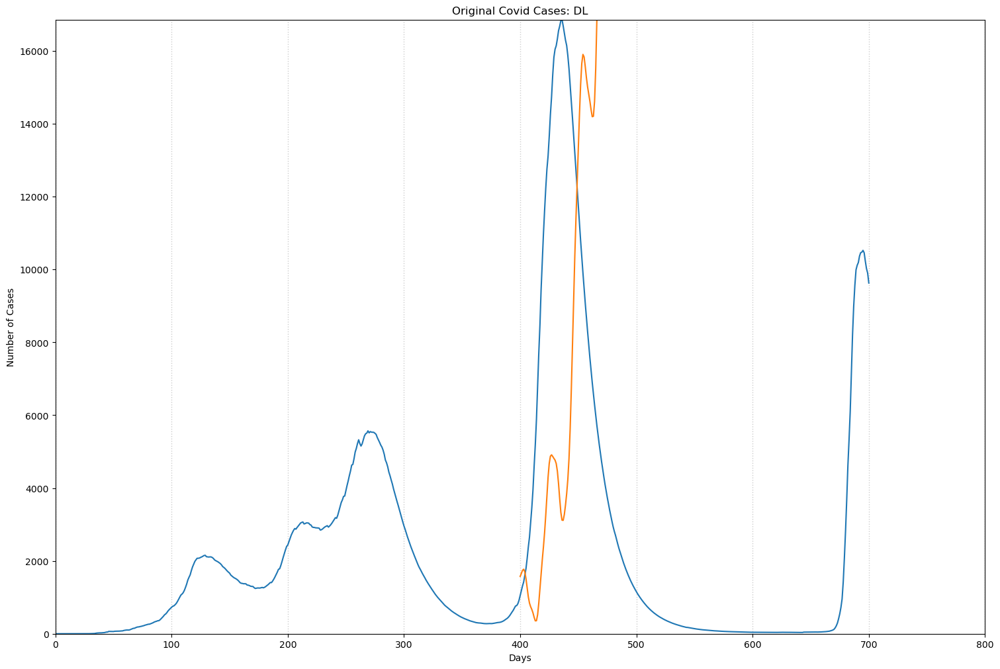

In [87]:
plot_widget_1("DL",train_params["start_day"]+train_params["train_days"]+ train_params["pred_days"])

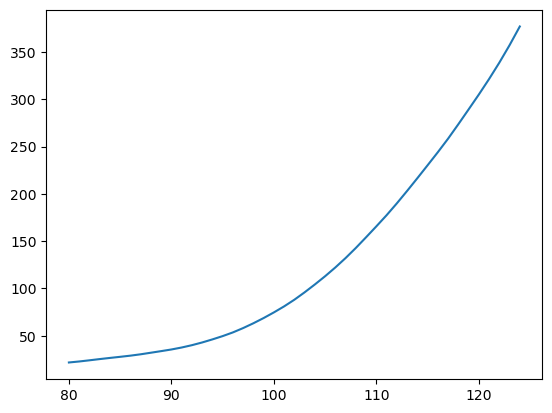

In [41]:
plt.plot(pred_timesteps,preds[15,:])

In [82]:
state_list = list(states)

def plot_widget_1(state_,x):
    
    fig = plt.figure(figsize=(15,10), constrained_layout=True)
    gs = fig.add_gridspec(nrows=1,ncols=1)

    ax1 = fig.add_subplot(gs[0,0])
    ax1.set_title(f"Original Covid Cases: {state_}")
    ax1.set_xlabel("Days")
    ax1.set_xlim([0,800])
    ax1.set_ylim([0, daily_cases.loc[state_,0:x].max()])
    ax1.set_ylabel("Number of Cases")
    daily_cases.loc[state_,0:x].plot(ax=ax1)
    ax1.grid(True,  color='k',alpha=0.2,linestyle=':',linewidth=1,axis='x')


    # ax2 = fig.add_subplot(gs[1,0])
    idx = state_list.index(state_)
    # ax2.set_title(f"HODMD Prediction: {state_}")
    # ax2.set_xlim([0,1023])
    # ax2.set_ylim([0, daily_cases.loc[state_,0:x].max()])
    exp.plot_pred(row_num=idx,ax=ax1)

    # ax2.set_xlabel("Days")
    # ax2.set_ylabel("Number of Cases")
    # ax2.grid(True,  color='k',alpha=0.2,linestyle=':',linewidth=1,axis='x')


#     ax3 = fig.add_subplot(gs[2,0])
#     MAPE_t = (np.abs(daily_cases.loc[state_,pred_timesteps].to_numpy() - preds[idx,:]))/(daily_cases.loc[state_,pred_timesteps].to_numpy())*100
#     plt.plot(pred_timesteps,MAPE_t)
#     ax3.set_title(f"MAPE(%) with time: {state_}")
#     ax3.set_xlabel("Days")
#     ax3.set_ylabel("MAPE(%)")
#     ax3.set_xlim([0,1023])
 

#     plt.show()

# widgets.interact(plot_widget_1,state_=state_list)





In [630]:
len(exps)

193

MovieWriter ffmpeg unavailable; using Pillow instead.


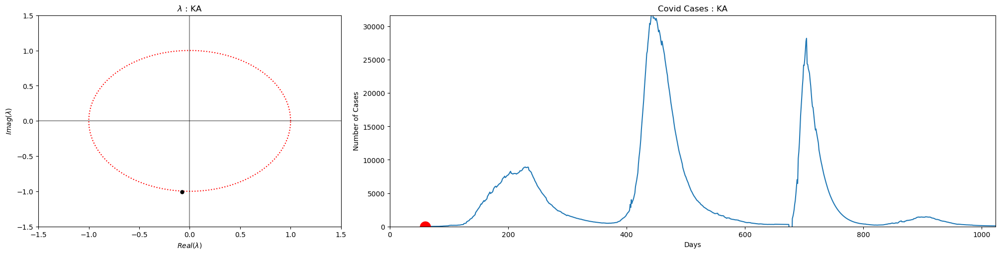

In [710]:
from matplotlib.animation import FuncAnimation

state="KA"
idx = state_list.index(state)

fig = plt.figure(figsize=(20,5), constrained_layout=True)
gs = fig.add_gridspec(nrows=1,ncols=3)
ax1 = fig.add_subplot(gs[0,0])
ax1.set_title(f"$\lambda$ : {state}")
ax1.set_xlim([-1.5,1.5])
ax1.set_ylim([-1.5,1.5])
ax1.set_xlabel("$Real(\lambda)$")
ax1.set_ylabel("$Imag(\lambda)$")

theta = np.linspace(0,2*np.pi,100)
x = np.cos(theta);
y = np.sin(theta);

ax1.plot(x,y,':r')
ax1.plot([0,0],[-1.5,1.5],'k',alpha=0.4)
ax1.plot([-1.5,1.5],[0,0],'k',alpha=0.4)
curr_state_lambda = lambdas[idx,:]
eig_marker,  = ax1.plot(curr_state_lambda[0].real,curr_state_lambda[0].imag,'k.',markersize=10)



ax2 = fig.add_subplot(gs[0,1:])
ax2.set_title(f"Covid Cases : {state}")

ax2.set_xlim([0,1023])
ax2.set_ylim([0, daily_cases.loc[state,:].max()+100])
ax2.set_xlabel("Days")
ax2.set_ylabel("Number of Cases")
curr_state_pred = preds[idx,:]
ax2.plot(pred_timesteps,curr_state_pred )
day_marker, = ax2.plot(pred_timesteps[0],curr_state_pred[0],'r.',markersize=30)


def animate(frame_num):
    day_marker.set_data((pred_timesteps[frame_num], curr_state_pred[frame_num]))
    eig_marker.set_data((curr_state_lambda[frame_num].real,curr_state_lambda[frame_num].imag))
    return day_marker,eig_marker


   
    
   

anim = FuncAnimation(fig, animate, frames=len(curr_state_pred), interval=100)
anim.save('../Figures/Trial/covidmoveMH.gif', 
          writer = 'ffmpeg', fps = 200)


In [ ]:
np.diff

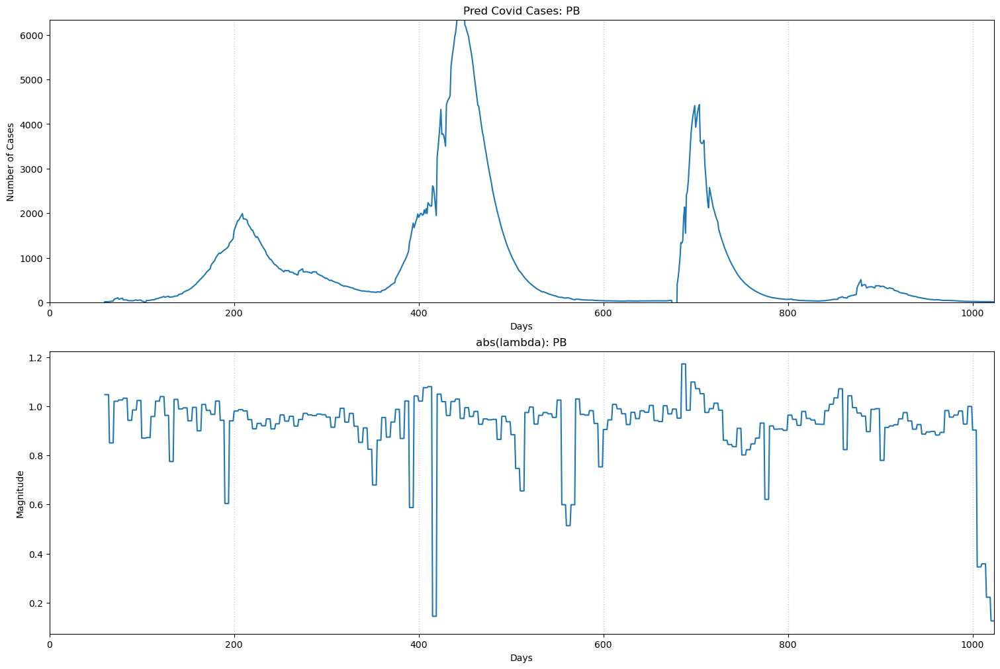

In [736]:
window_size=5
def zero_crossings(arr, window_size):
    num_windows = len(arr) - window_size + 1
    zero_crossings = np.zeros(num_windows)
    for i in range(num_windows):
        window = arr[i:i+window_size]
        zero_crossings[i] = np.sum(np.diff(np.sign(window)))
    return zero_crossings


state_="PB"
idx = state_list.index(state_)
curr_state_lambda = lambdas[idx,:]
curr_state_pred = preds[idx,:]

fig = plt.figure(figsize=(15,10), constrained_layout=True)
gs = fig.add_gridspec(nrows=2,ncols=1)


ax1 = fig.add_subplot(gs[0,0])
ax1.set_title(f"Pred Covid Cases: {state_}")
ax1.set_xlabel("Days")
ax1.set_xlim([0,1023])
ax1.set_ylim([0, daily_cases.loc[state_,:].max()])
ax1.set_ylabel("Number of Cases")
plt.plot(pred_timesteps,curr_state_pred)
ax1.grid(True,  color='k',alpha=0.2,linestyle=':',linewidth=1,axis='x')


ax2 = fig.add_subplot(gs[1,0])
idx = state_list.index(state_)
ax2.set_title(f"abs(lambda): {state_}")
ax2.set_xlim([0,1023])

zcc = (zero_crossings(curr_state_lambda.real,window_size))  + (zero_crossings(curr_state_lambda.imag,window_size) )
zcc = zcc*(zcc>2)

#plt.plot(pred_timesteps[:-(window_size-1)],zcc)
plt.plot(pred_timesteps, np.abs(curr_state_lambda))

ax2.set_xlabel("Days")
ax2.set_ylabel("Magnitude")
ax2.grid(True,  color='k',alpha=0.2,linestyle=':',linewidth=1,axis='x')

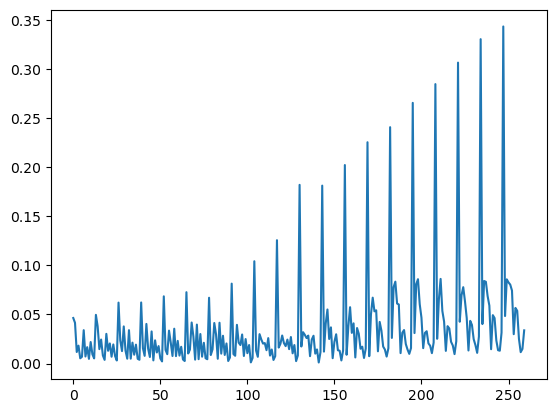

In [760]:
plt.plot(np.abs(exps[160].DMD.modes[:,16]))

In [738]:
exps[0].DMD.modes.shape

(280, 36)

In [674]:
pred_timesteps[:-(window_size-1)]

(911,)

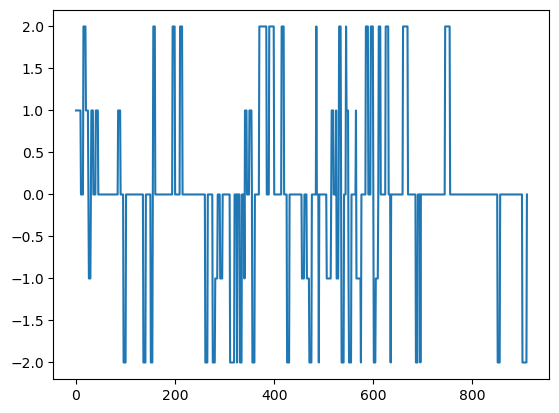

In [669]:
plt.plot(zero_crossings(curr_state_lambda.imag,60))

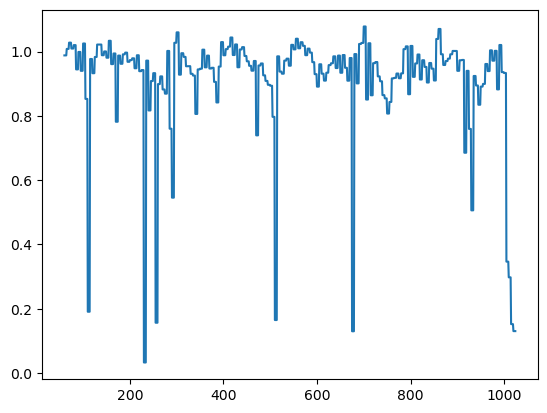

In [662]:
plt.plot(pred_timesteps, np.abs(curr_state_lambda))

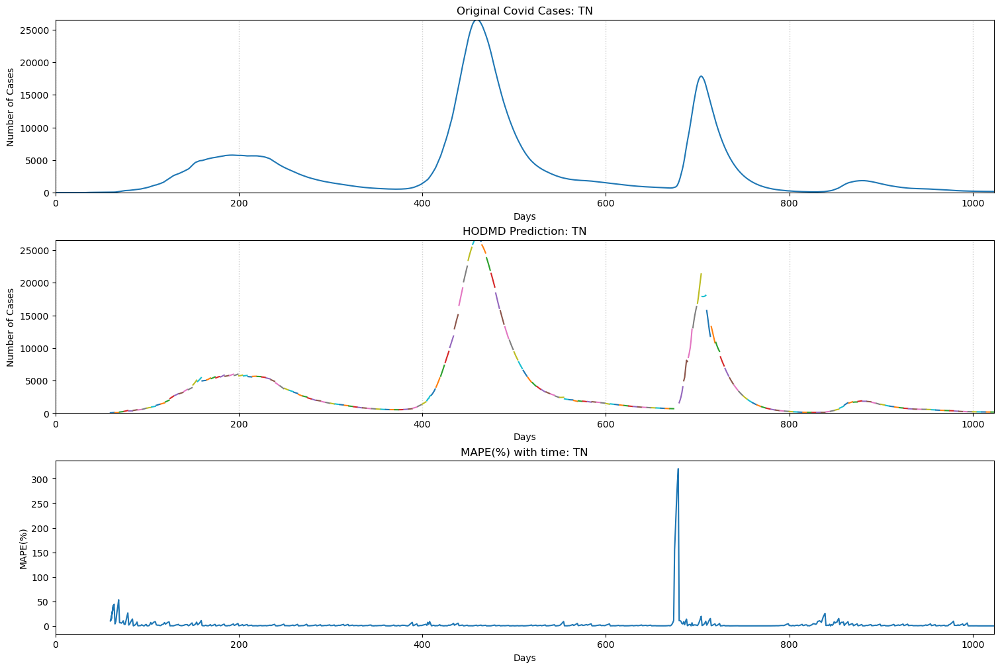

In [584]:
plot_widget_1("TN")

c:\Users\aadha\Anaconda3\lib\site-packages\matplotlib\animation.py:879: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(
MovieWriter ffmpeg unavailable; using Pillow instead.


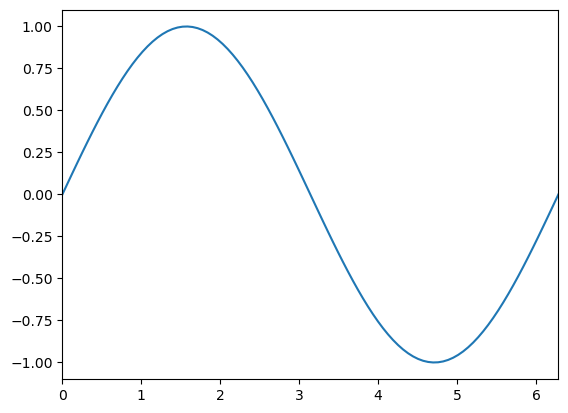

In [596]:
%matplotlib inline 
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots()
line, = ax.plot([])     # A tuple unpacking to unpack the only plot
ax.set_xlim(0, 1023)
ax.set_ylim(-1.1, 1.1)

x = np.linspace(0, 2*np.pi, 100)
y = np.sin(x)

def animate(frame_num):
    y = np.sin(x + 2*np.pi * frame_num/100)
    line.set_data((x, y))
    return line

anim = FuncAnimation(fig, animate, frames=100, interval=20)
anim.save('../Figures/Trial/continuousSineWave.gif', 
          writer = 'ffmpeg', fps = 30)

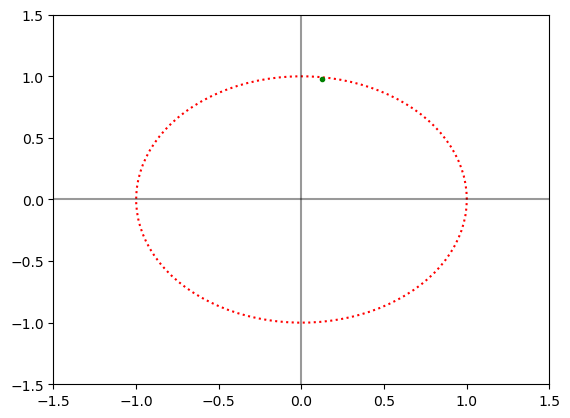

In [577]:
theta = np.linspace(0,2*np.pi,100)
x = np.cos(theta);
y = np.sin(theta);

fig, ax = plt.subplots(1, 1)
ax.plot(x,y,':r')
ax.plot([0,0],[-1.5,1.5],'k',alpha=0.4)
ax.plot([-1.5,1.5],[0,0],'k',alpha=0.4)
ax.set_xlim([-1.5,1.5])
ax.set_ylim([-1.5,1.5])
for exp in exps:
    ax.plot(exp.DMD.eigs[16].real,exp.DMD.eigs[16].imag,'g.')
    plt.pause(0.1)
  
    plt.show()
    ax.clear()
    


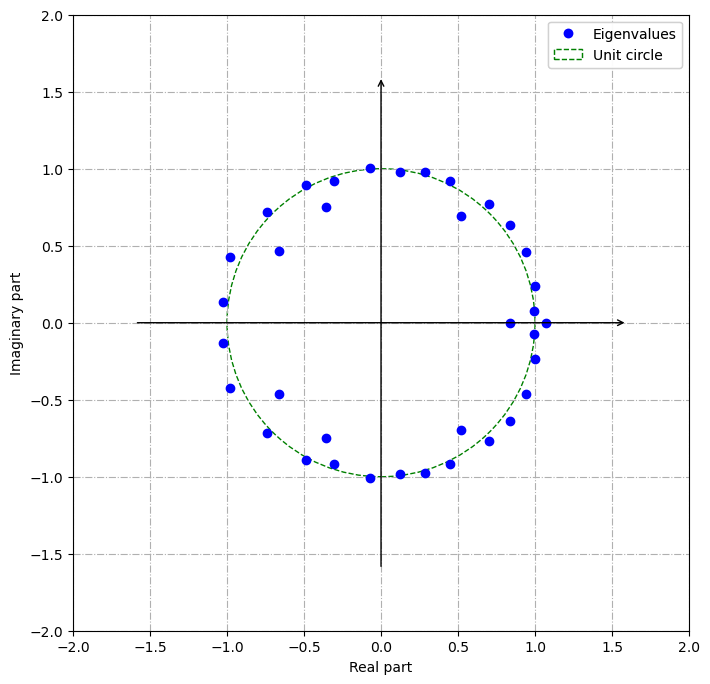

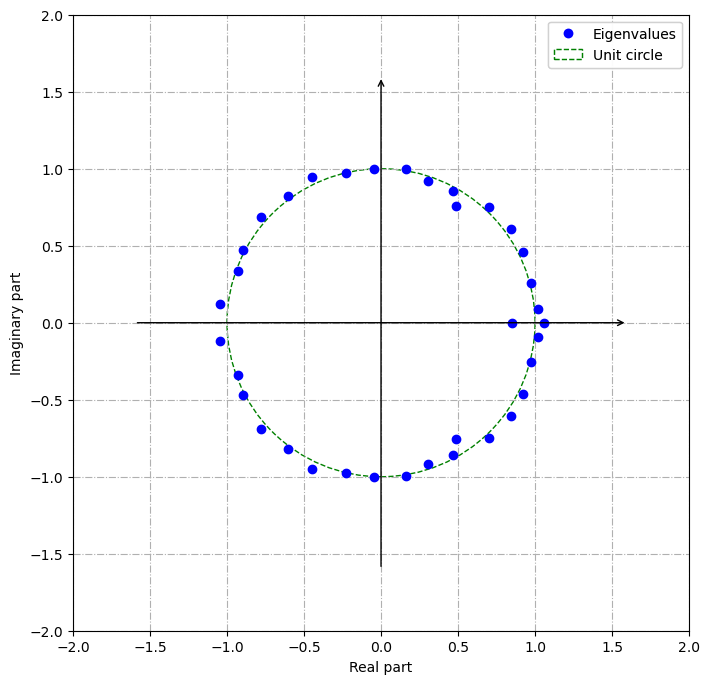

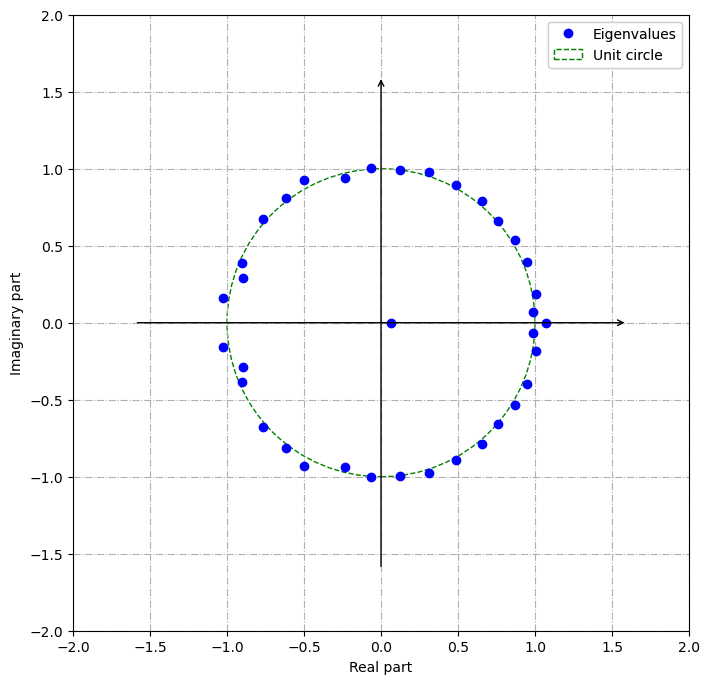

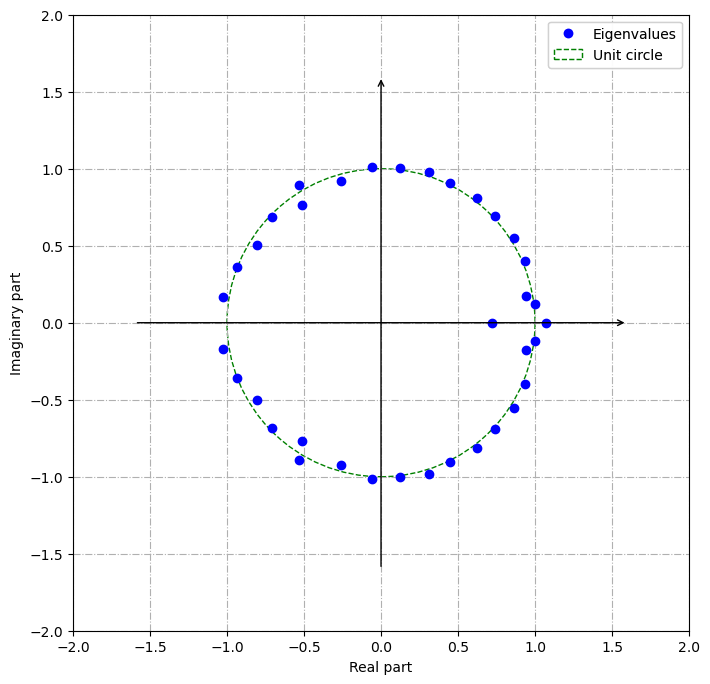

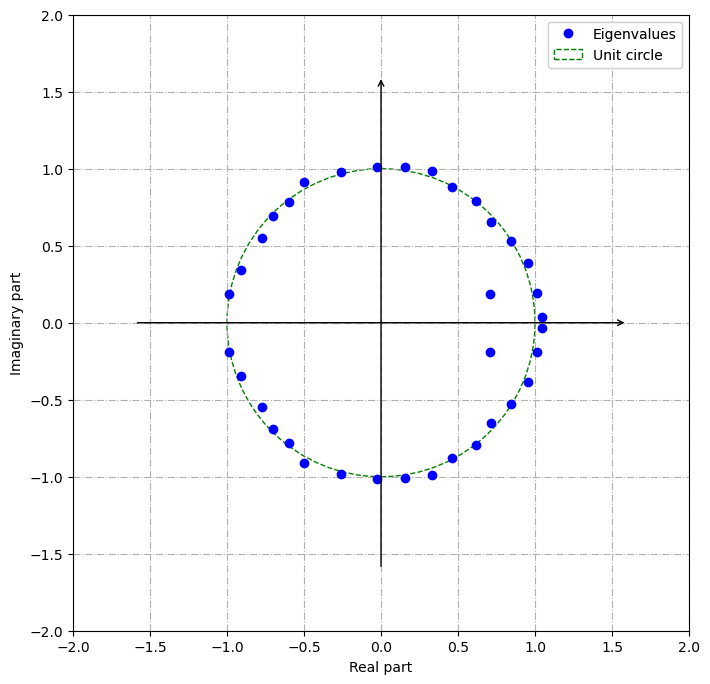

...

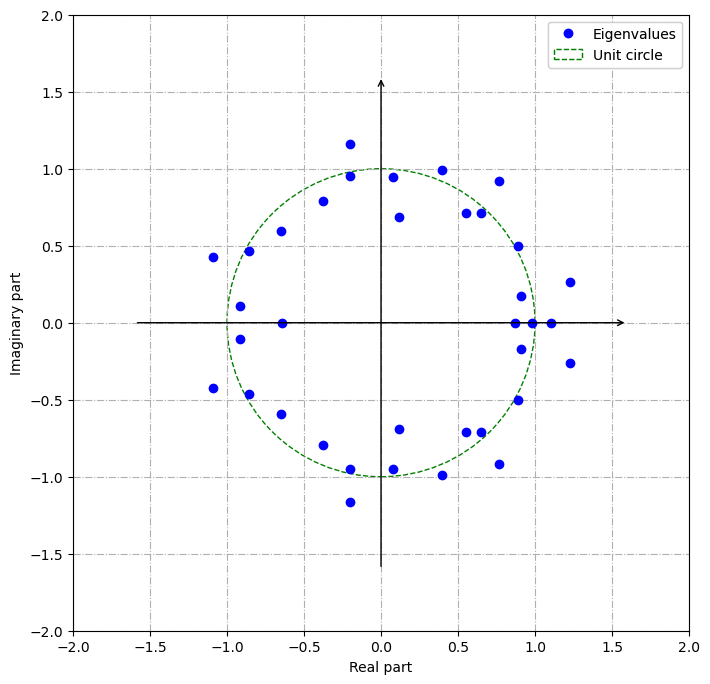

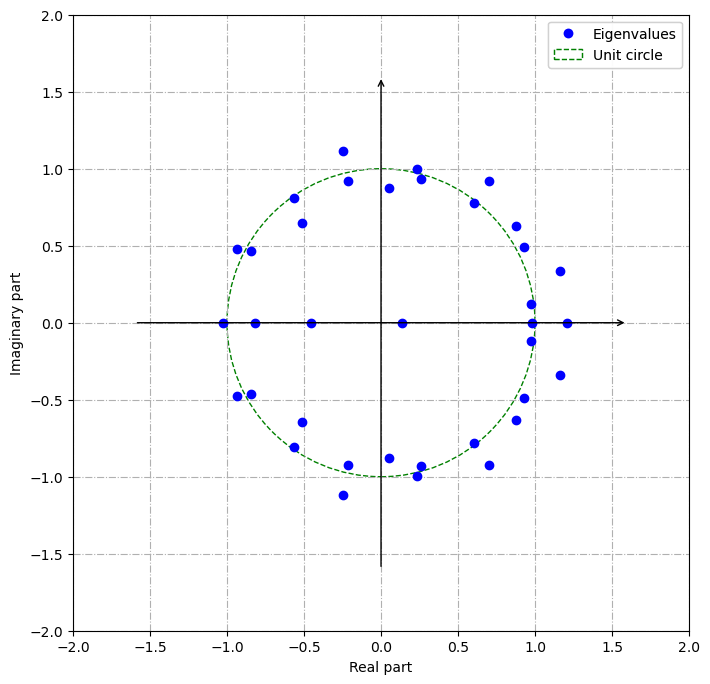

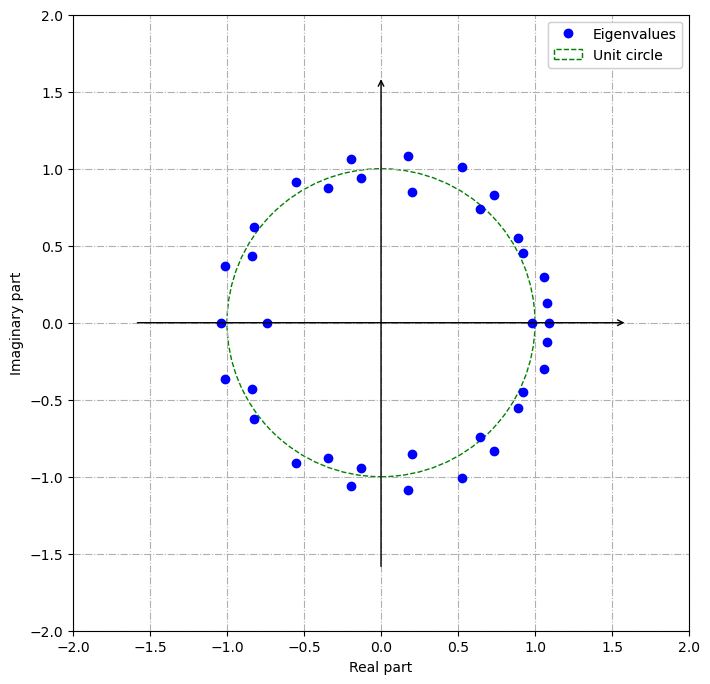

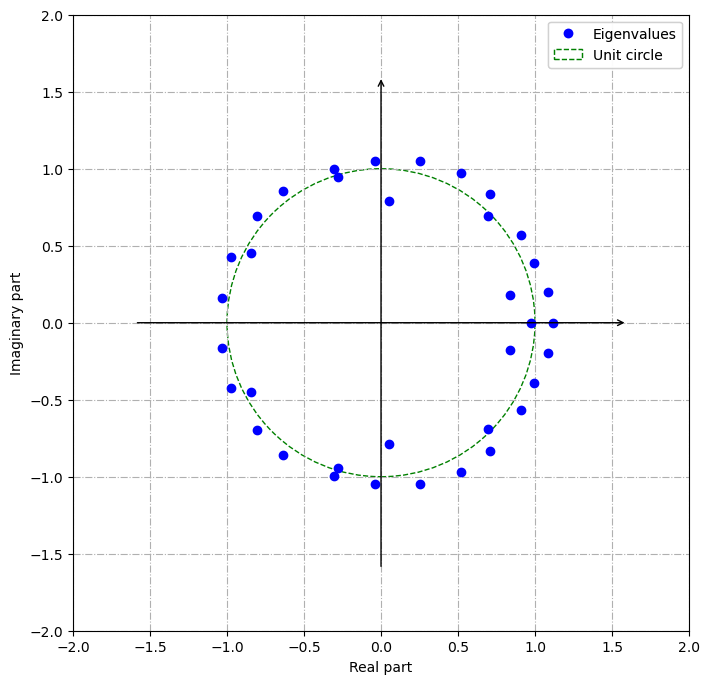

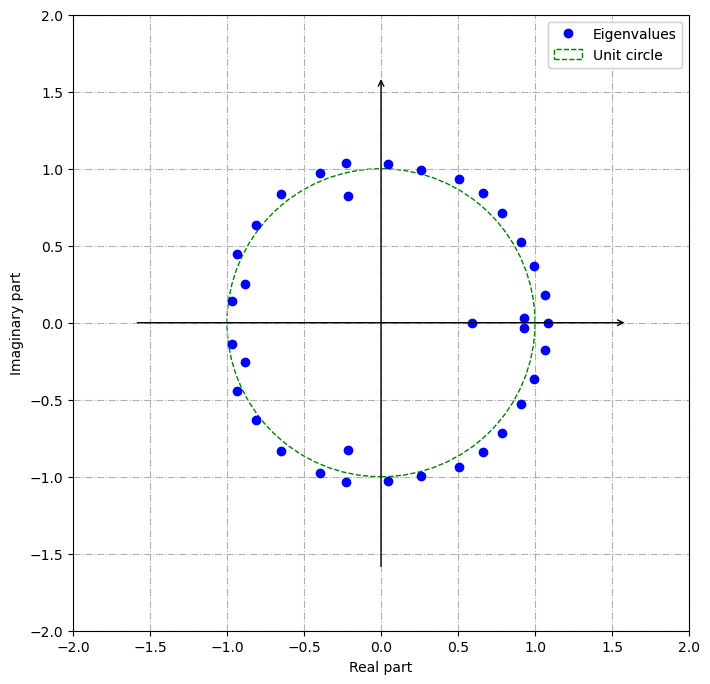

KeyboardInterrupt: 

In [556]:
for i in range(len(exps)):
    exps[i].DMD.plot_eigs()
    
        
        

In [542]:
state_list = list(states)

def plot_widget_1(state_):
    
    fig = plt.figure(figsize=(15,10), constrained_layout=True)
    gs = fig.add_gridspec(nrows=3,ncols=1)

    ax1 = fig.add_subplot(gs[0,0])
    ax1.set_title(f"Original Covid Cases: {state_}")
    ax1.set_xlabel("Days")
    ax1.set_xlim([0,1023])
    ax1.set_ylim([0, daily_cases.loc[state_,:].max()])
    ax1.set_ylabel("Number of Cases")
    daily_cases.loc[state_,:].plot(ax=ax1)
    ax1.grid(True,  color='k',alpha=0.2,linestyle=':',linewidth=1,axis='x')


    ax2 = fig.add_subplot(gs[1,0])
    idx = state_list.index(state_)
    ax2.set_title(f"HODMD Prediction: {state_}")
    ax2.set_xlim([0,1023])
    ax2.set_ylim([0, daily_cases.loc[state_,:].max()])
    for i in range(len(exps)):
    
        exps[i].plot_pred(row_num=idx,ax=ax2)

    ax2.set_xlabel("Days")
    ax2.set_ylabel("Number of Cases")
    ax2.grid(True,  color='k',alpha=0.2,linestyle=':',linewidth=1,axis='x')


    ax3 = fig.add_subplot(gs[2,0])
    MAPE_t = (np.abs(daily_cases.loc[state_,pred_timesteps].to_numpy() - preds[idx,:]))/(daily_cases.loc[state_,pred_timesteps].to_numpy())*100
    plt.plot(pred_timesteps,MAPE_t)
    ax3.set_title(f"MAPE(%) with time: {state_}")
    ax3.set_xlabel("Days")
    ax3.set_ylabel("MAPE(%)")
    ax3.set_xlim([0,1023])
 

    plt.show()

widgets.interact(plot_widget_1,state_=state_list)





interactive(children=(Dropdown(description='state_', options=('AN', 'AP', 'AR', 'AS', 'BR', 'CH', 'CT', 'DN', …

<function __main__.plot_widget_1(state_)>

In [482]:
exps[1].MAPE()[16]

1.7885364983786225

In [485]:
MAPEs = []

for i in range(len(exps)):
    MAPEs.append(exps[i].MAPE()[16]*100);
    

In [487]:
np.mean(MAPEs)

23.36539798831451

Text(0, 0.5, 'MAPE')

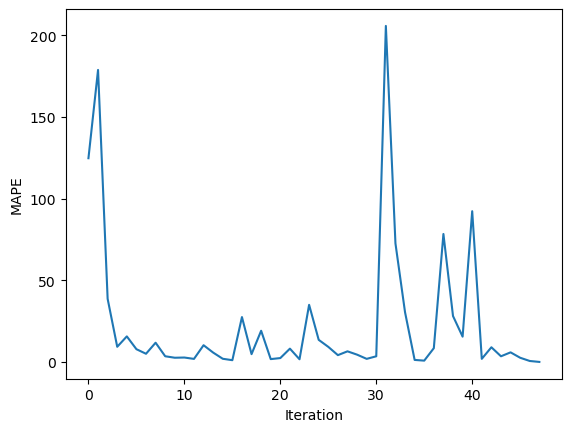

In [486]:
plt.plot(MAPEs)
plt.xlabel("Iteration")
plt.ylabel("MAPE")

(36,)


c:\Users\aadha\Anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 1.3460079152680745e+19. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(


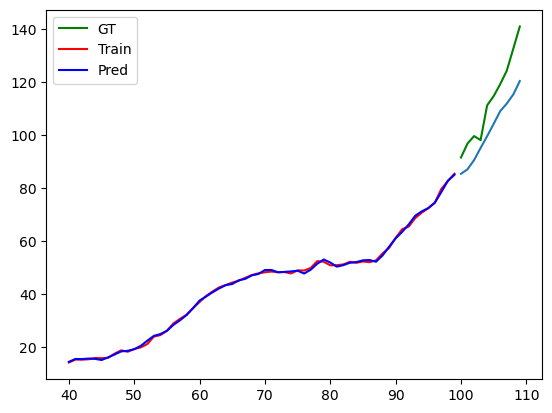

In [407]:

train_params = {"start_day":40, "train_days":60, "pred_days":10}

exp = Experiment(daily_cases,train_params=train_params,HODMD_params=HODMD_params)
exp.fit()
exp.pred();
exp.plot_pred()


In [404]:
exp.DMD.modes.shape

(520, 20)

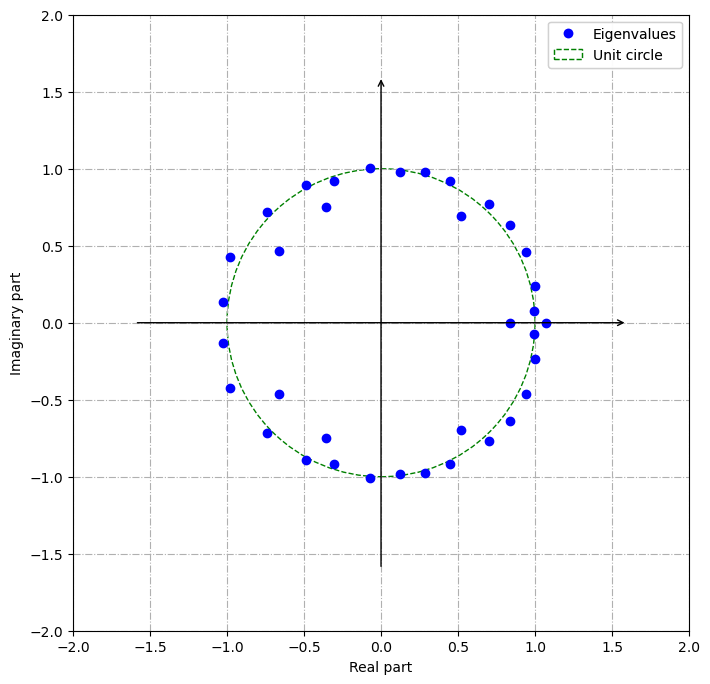

In [393]:
exp.DMD.plot_eigs()

In [327]:
exp.DMD.dmd_timesteps

array([ 40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104])

In [ ]:
fig = plt.figure(figsize=(10,10), constrained_layout=True)
    gs = fig.add_gridspec(nrows=2,ncols=1)

    ax1 = fig.add_subplot(gs[0,0])
    ax1.set_title("Day Wise Cases")
    ax1.set_xlabel("Days")
    ax1.set_ylabel("Number of Cases")
    daily_cases.loc[state,:].plot(ax=ax1)
    ax1.grid(True,  color='k',alpha=0.2,linestyle=':',linewidth=1,axis='x')


    ax2 = fig.add_subplot(gs[1,0])
    ax2.set_title("Cumulative Cases")
    cumulative_cases.loc[state,:].plot(ax=ax2)
    ax2.set_xlabel("Days")
    ax2.set_ylabel("Number of Cases")
    ax2.grid(True,  color='k',alpha=0.2,linestyle=':',linewidth=1,axis='x')

    plt.show()

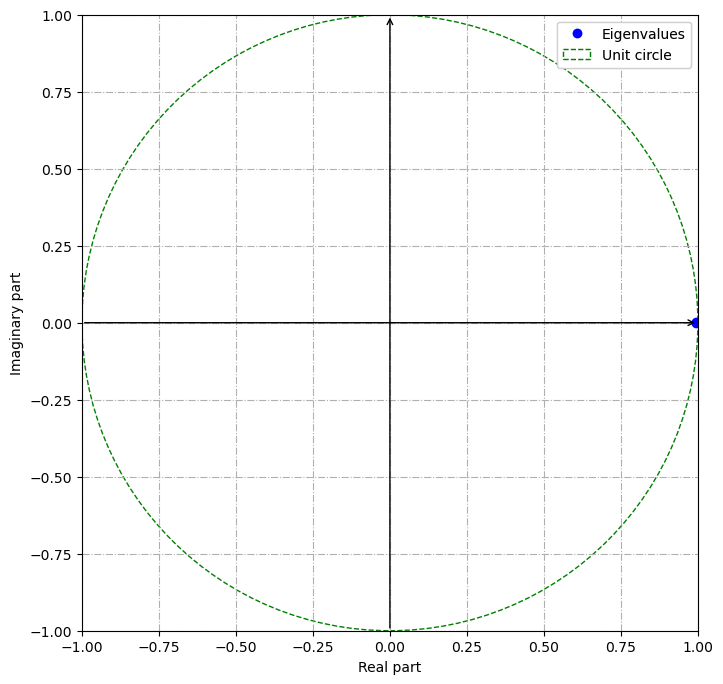

In [383]:
exp.DMD.plot_eigs()

In [381]:
train_params = {"start_day":450, "train_days":60, "pred_days":10}
HODMD_params = { "svd_rank":cumulative_cases.shape[0], "tlsq_rank":0, "exact":False, "opt":False,
                 "rescale_mode":None, "forward_backward":False, "d":58,
                 "sorted_eigs":False, "reconstruction_method":"first",
                 "svd_rank_extra":0}

exp = Experiment(cumulative_cases,train_params=train_params,HODMD_params=HODMD_params)
exp.fit()


(36, 60)


c:\Users\aadha\Anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 51299746394.89128. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
c:\Users\aadha\Anaconda3\lib\site-packages\pydmd\dmdbase.py:715: UserWarning: Input data matrix X has condition number 770467.6497754897. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(


In [378]:
cumulative_cases.shape[0]

36

In [382]:
exp.DMD.eigs

array([0.9930299+0.00131665j, 0.9930299-0.00131665j])

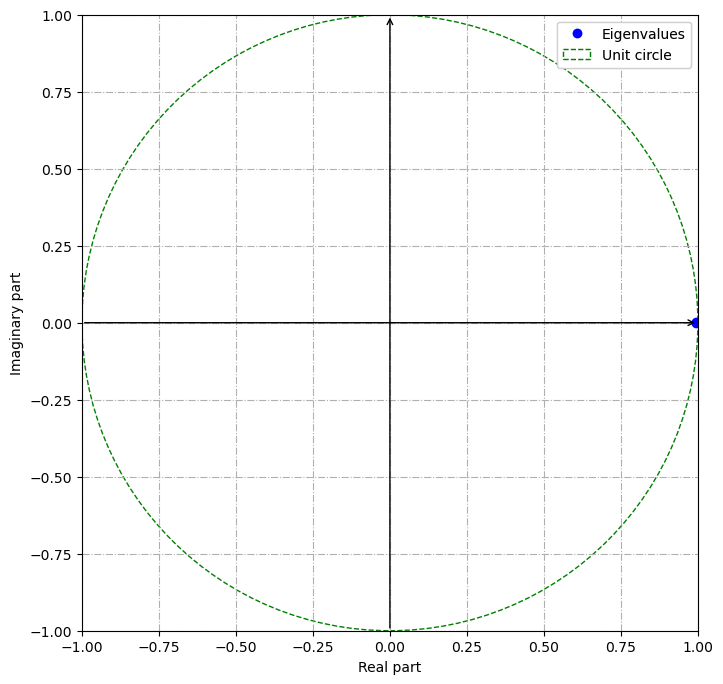

In [376]:
exp.DMD.plot_eigs()

In [347]:
x = np.arange(0,10*len(states),10)
plt.plot(x,exp.metrics["MAPE"],'r.')
plt.xticks(ticks=x , labels=states);
ax = plt.gca()
ax.tick_params(axis='x', labelrotation = 90)
plt.grid(axis='x')

KeyError: 'MAPE'

In [348]:

x = np.arange(0,10*len(states),10)
plt.plot(x,exp.metrics["MAPE"],'r.')
plt.xticks(ticks=x , labels=states);
ax = plt.gca()
ax.tick_params(axis='x', labelrotation = 90)
plt.grid(axis='x')

KeyError: 'MAPE'

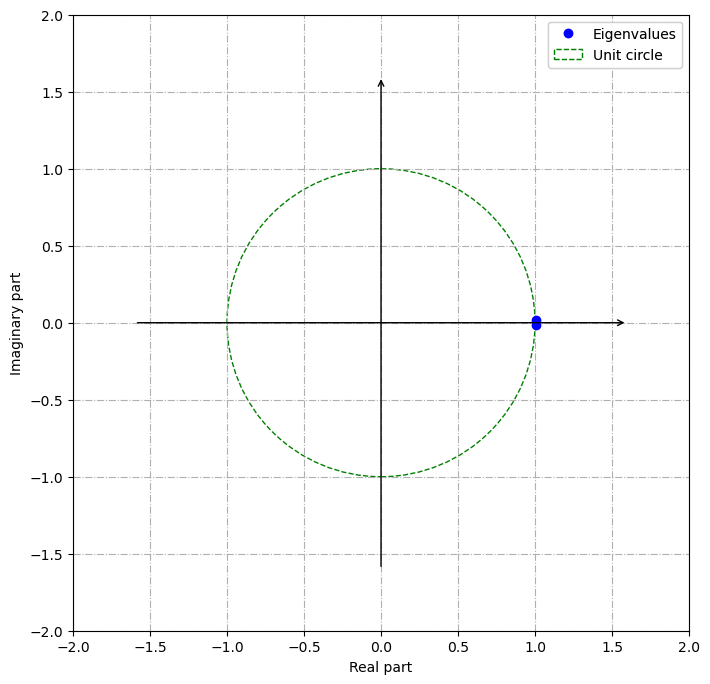

<AxesSubplot: >

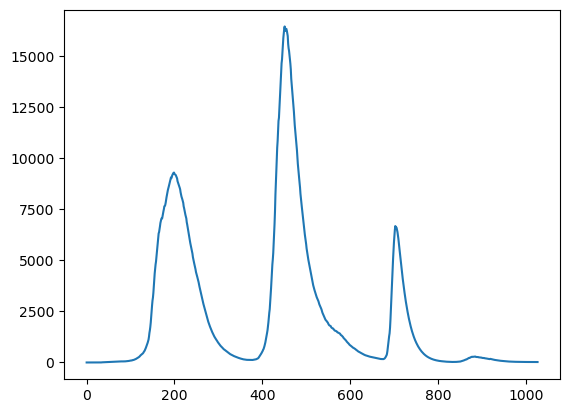

In [365]:
daily_cases.iloc[1,:].plot()